In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [4]:
DATASET_ID = 'buckeye'

In [5]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [6]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [7]:
hparams = HParams(
    num_mel_bins = 32,
    mel_lower_edge_hertz=100,
    mel_upper_edge_hertz=7998,
    butter_lowcut = 100,
    butter_highcut = 7998,
    ref_level_db = 20,
    min_level_db = -40,
    mask_spec = True,
    win_length_ms = 4.0,
    hop_length_ms = 1.0,
    n_jobs = -1,
    verbosity=1,
    nex = -1
)

In [8]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:   19.1s


[Parallel(n_jobs=-1)]: Done 254 out of 254 | elapsed:   19.9s finished


In [9]:
dataset.sample_json

OrderedDict([('species', 'Homo sapien'),
             ('age', 'o'),
             ('sex', 'f'),
             ('common_name', 'Human'),
             ('samplerate_hz', 16000),
             ('length_s', 587.8899375),
             ('wav_loc',
              '/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/processed/buckeye/2019-10-08_21-32-02/WAV/s0702b.WAV'),
             ('indvs',
              OrderedDict([('s07',
                            OrderedDict([('words',
                                          OrderedDict([('start_times',
                                                        [4.885333,
                                                         5.698899,
                                                         5.903525,
                                                         6.255056,
                                                         6.526125,
                                                         6.640816,
                                                    

In [10]:
n_jobs = -1
verbosity=1

In [11]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=[
                "labels",
                "word",
                "utterance_number",
                "position_in_utterance",
                "position_in_word",
                "word_number",
            ],
            unit="phones",
            dict_features_to_retain=["age", "sex"],
            key=key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:   18.8s


[Parallel(n_jobs=-1)]: Done 254 out of 254 | elapsed:   30.8s finished


838066

In [12]:
syllable_df[:3]

,start_time,end_time,labels,word,utterance_number,position_in_utterance,position_in_word,word_number,indv,indvi,age,sex,key
0,4.885333,4.988600,w,well,0,0,0,0,s07,0,o,f,s0702b
1,4.988600,5.114649,eh,well,1,0,1,0,s07,0,o,f,s0702b
2,5.114649,5.255262,l,well,2,0,2,0,s07,0,o,f,s0702b


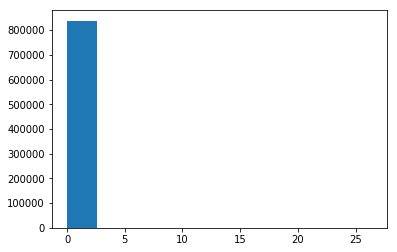

In [13]:
plt.hist(np.array(syllable_df.end_time.values - syllable_df.start_time.values));

In [14]:
syllable_df = syllable_df[syllable_df.end_time.values - syllable_df.start_time.values < 3]

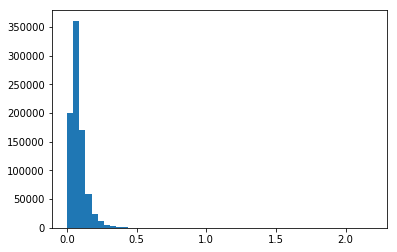

In [15]:
plt.hist(np.array(syllable_df.end_time.values - syllable_df.start_time.values), bins=50);

In [16]:
syllable_df = syllable_df[syllable_df.end_time.values - syllable_df.start_time.values > 0.005]

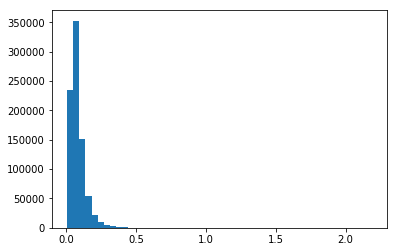

In [17]:
plt.hist(np.array(syllable_df.end_time.values - syllable_df.start_time.values), bins=50);

### get audio for dataset

In [18]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(get_row_audio)(
            syllable_df[syllable_df.key == key], 
            dataset.data_files[key].data['wav_loc'], 
            dataset.hparams
        )
        for key in tqdm(syllable_df.key.unique())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:   27.7s


[Parallel(n_jobs=-1)]: Done 254 out of 254 | elapsed:   42.0s finished


838029

In [19]:
syllable_df[:3]

,start_time,end_time,labels,word,utterance_number,position_in_utterance,position_in_word,word_number,indv,indvi,age,sex,key,audio,rate
0,4.885333,4.988600,w,well,0,0,0,0,s07,0,o,f,s0702b,"[-0.0019976329461109253, -0.001667859911609773...",16000
1,4.988600,5.114649,eh,well,1,0,1,0,s07,0,o,f,s0702b,"[0.1252517018882723, 0.1340101326777945, 0.132...",16000
2,5.114649,5.255262,l,well,2,0,2,0,s07,0,o,f,s0702b,"[-0.1710023561962039, -0.15910356586042257, -0...",16000


In [20]:
sylls = syllable_df.audio.values

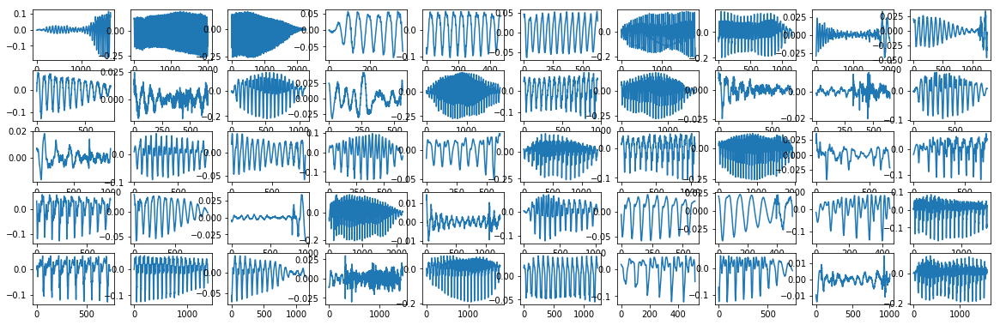

In [21]:
nrows = 5
ncols = 10
zoom = 2
fig, axs = plt.subplots(ncols=ncols, nrows = nrows,figsize = (ncols*zoom, nrows+zoom/1.5))
for i, syll in tqdm(enumerate(sylls), total = nrows*ncols):
    ax = axs.flatten()[i]
    ax.plot(syll)
    if i == nrows*ncols -1:
        break

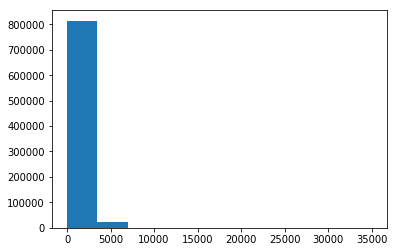

In [22]:
plt.hist([len(i) for i in syllable_df.audio.values]);

In [30]:
syll_lens = np.array([len(i) for i in tqdm(syllable_df.audio.values)])

In [31]:
syllable_df = syllable_df[syll_lens > 100]

In [32]:
syllable_df['audio'] = [i/np.max(i) for i in tqdm(syllable_df.audio.values)]

### Create spectrograms

In [67]:
from avgn.visualization.spectrogram import draw_spec_set
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram

In [68]:
syllables_wav = syllable_df.audio.values
syllables_rate = syllable_df.rate.values

In [69]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    # create spectrograms
    syllables_spec = parallel(
        delayed(make_spec)(
            syllable,
            rate,
            hparams=dataset.hparams,
            mel_matrix=dataset.mel_matrix,
            use_mel=True,
            use_tensorflow=False,
        )
        for syllable, rate in tqdm(
            zip(syllables_wav, syllables_rate),
            total=len(syllables_rate),
            desc="getting syllable spectrograms",
            leave=False,
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done 186 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 8270 tasks      | elapsed:   27.2s
[Parallel(n_jobs=-1)]: Done 21570 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 38670 tasks      | elapsed:   35.9s
[Parallel(n_jobs=-1)]: Done 59570 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 84270 tasks      | elapsed:   47.9s
[Parallel(n_jobs=-1)]: Done 112770 tasks      | elapsed:   55.3s
[Parallel(n_jobs=-1)]: Done 145070 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 181170 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 221070 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 264770 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 312270 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 363570 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Do

### Rescale spectrogram
- using log rescaling

In [70]:
log_scaling_factor = 4

In [71]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllables_spec = parallel(
        delayed(log_resize_spec)(spec, scaling_factor=log_scaling_factor)
        for spec in tqdm(syllables_spec, desc="scaling spectrograms", leave=False)
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 13176 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 56176 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 116376 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 193776 tasks      | elapsed:   26.3s
[Parallel(n_jobs=-1)]: Done 288376 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 400176 tasks      | elapsed:   54.1s
[Parallel(n_jobs=-1)]: Done 529176 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 675376 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 837207 out of 837207 | elapsed:  1.9min finished


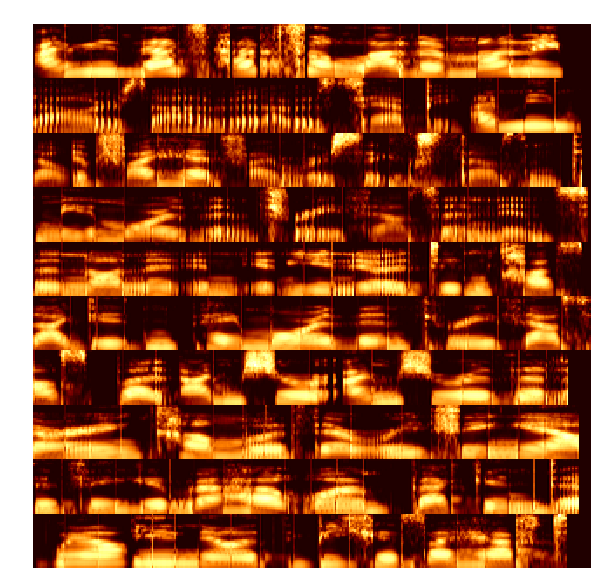

In [72]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=10)

### Pad spectrograms

In [73]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
pad_length = np.max(syll_lens)

In [74]:
syllable_df = syllable_df[np.array(syll_lens) < 25]

In [75]:
np.max(syll_lens)

24

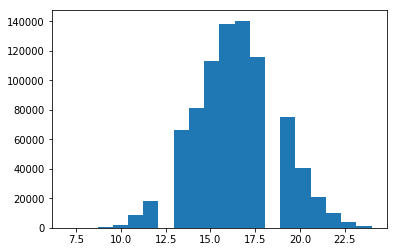

In [76]:
plt.hist(syll_lens, bins=20);

In [77]:
syllable_df[:3]

,start_time,end_time,labels,word,utterance_number,position_in_utterance,position_in_word,word_number,indv,indvi,age,sex,key,audio,rate,spectrogram
0,4.885333,4.988600,w,well,0,0,0,0,s07,0,o,f,s0702b,"[-0.01725538584843273, -0.014406834034244777, ...",16000,"[[2, 2, 2, 2, 2, 2, 2, 0, 44, 79, 95, 86, 81, ..."
1,4.988600,5.114649,eh,well,1,0,1,0,s07,0,o,f,s0702b,"[0.6202093932054022, 0.6635785527737617, 0.653...",16000,"[[4, 4, 4, 4, 4, 174, 166, 164, 162, 160, 159,..."
2,5.114649,5.255262,l,well,2,0,2,0,s07,0,o,f,s0702b,"[-1.0220360017116719, -0.9509200687473669, -0....",16000,"[[5, 5, 5, 5, 5, 170, 156, 156, 154, 151, 149,..."


In [78]:
len(syllable_df)

837207

In [79]:
import seaborn as sns

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/statsmodels/nonparametric/bandwidths.py:20: RuntimeWarning: invalid value encountered in minimum
  return np.minimum(np.std(X, axis=0, ddof=1), IQR)
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


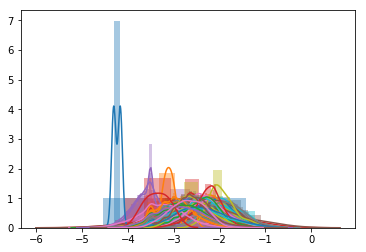

In [90]:
for indv in np.unique(syllable_df.labels):
    sns.distplot(np.log(syllable_df[syllable_df.labels==indv]["end_time"] - syllable_df[syllable_df.labels==indv]["start_time"]), label=indv)
#plt.legend();

In [81]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:

    syllables_spec = parallel(
        delayed(pad_spectrogram)(spec, pad_length)
        for spec in tqdm(
            syllables_spec, desc="padding spectrograms", leave=False
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 14340 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 38140 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 68740 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 106140 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 150340 tasks      | elapsed:   22.4s
[Parallel(n_jobs=-1)]: Done 201340 tasks      | elapsed:   28.9s
[Parallel(n_jobs=-1)]: Done 259140 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 323740 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done 395140 tasks      | elapsed:   55.2s
[Parallel(n_jobs=-1)]: Done 473340 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 558340 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 650140 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]:

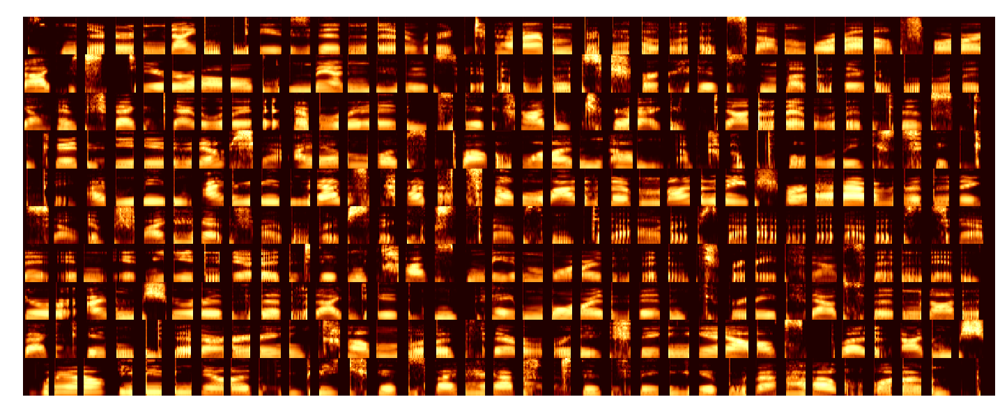

In [82]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

In [83]:
np.shape(syllables_spec)

(837207, 32, 24)

In [84]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

def remove_med(x):
    x[x<=np.median(x)] = 0
    return x

syllables_spec = [(norm(i)*255).astype('uint8') for i in tqdm(syllables_spec)]
#syllables_spec = [remove_med(i) for i in tqdm(syllables_spec)]

In [85]:
syllable_df['spectrogram'] = syllables_spec

In [86]:
syllable_df[:3]

,start_time,end_time,labels,word,utterance_number,position_in_utterance,position_in_word,word_number,indv,indvi,age,sex,key,audio,rate,spectrogram
0,4.885333,4.988600,w,well,0,0,0,0,s07,0,o,f,s0702b,"[-0.01725538584843273, -0.014406834034244777, ...",16000,"[[2, 2, 2, 2, 0, 44, 79, 95, 86, 81, 77, 38, 3..."
1,4.988600,5.114649,eh,well,1,0,1,0,s07,0,o,f,s0702b,"[0.6202093932054022, 0.6635785527737617, 0.653...",16000,"[[4, 4, 174, 166, 164, 162, 160, 159, 159, 161..."
2,5.114649,5.255262,l,well,2,0,2,0,s07,0,o,f,s0702b,"[-1.0220360017116719, -0.9509200687473669, -0....",16000,"[[5, 5, 170, 156, 156, 154, 151, 149, 147, 144..."


### view syllables per indv

In [87]:
syllable_df.indv.unique()

array(['s07', 's02', 's06', 's03', 's27', 's22', 's26', 's23', 's09',
       's20', 's25', 's08', 's21', 's24', 's29', 's05', 's28', 's01',
       's04', 's36', 's40', 's16', 's12', 's11', 's39', 's15', 's19',
       's35', 's37', 's32', 's33', 's17', 's13', 's10', 's14', 's38',
       's30', 's31', 's34', 's18'], dtype=object)

s01 14523


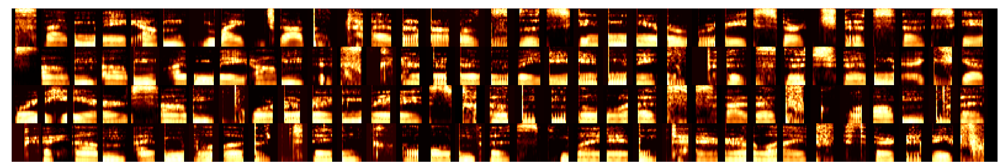

s02 20732


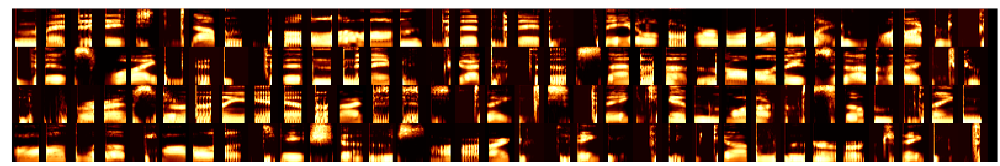

s03 17378


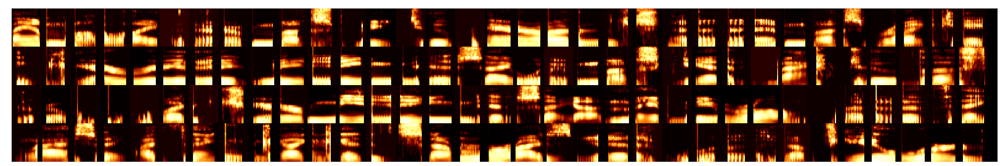

s04 19108


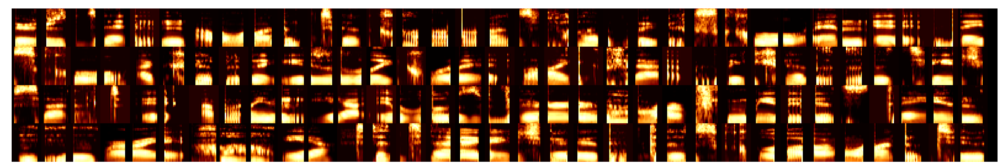

s05 16345


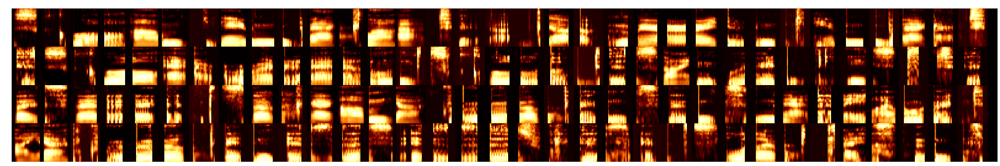

s06 10639


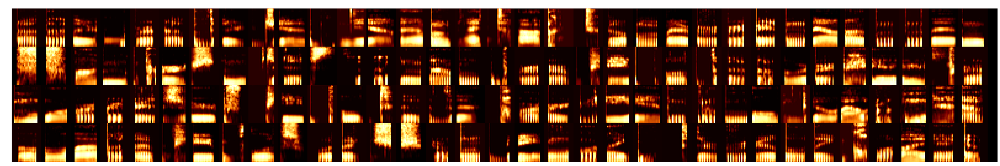

s07 27999


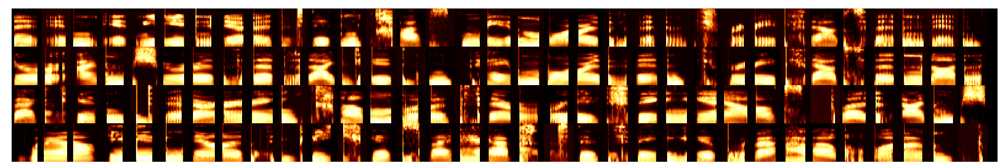

s08 22728


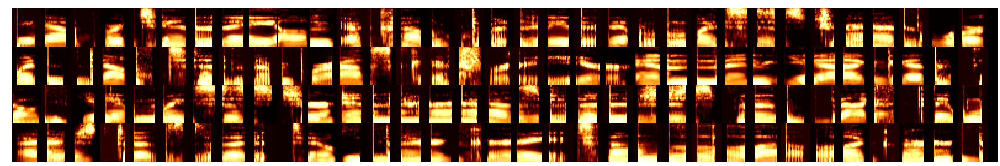

s09 20053


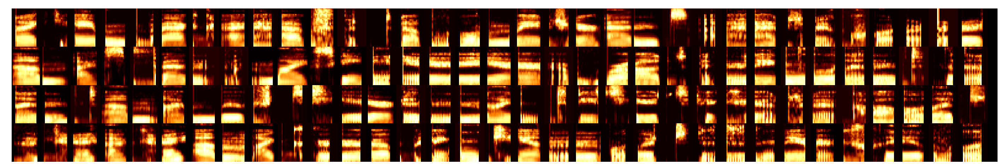

s10 31600


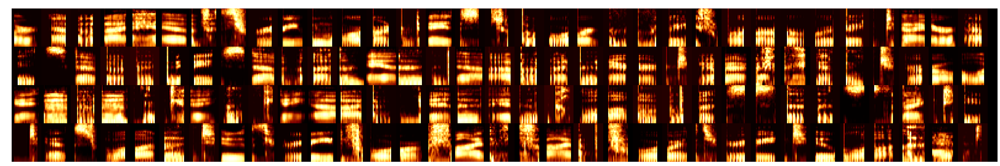

s11 20583


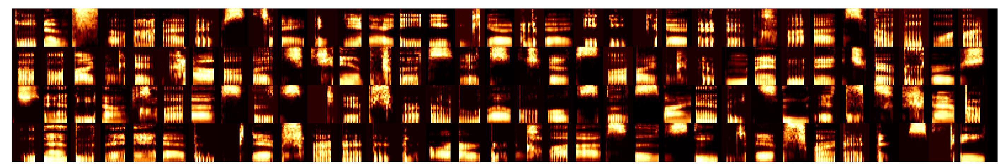

s12 27160


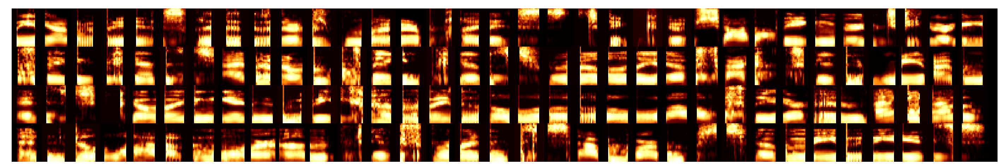

s13 27202


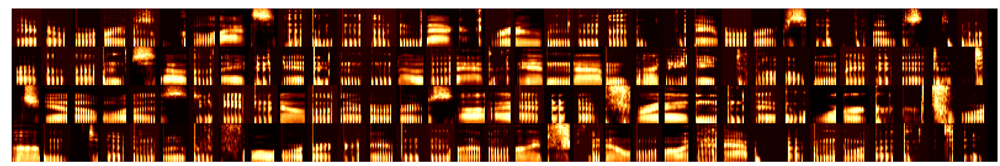

s14 26111


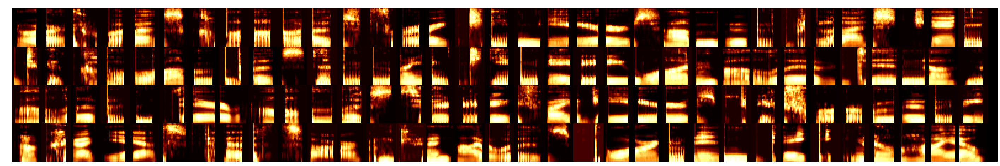

s15 24764


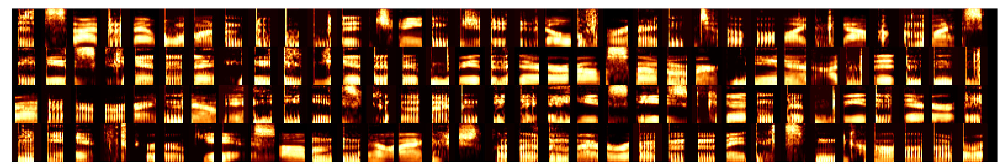

s16 34800


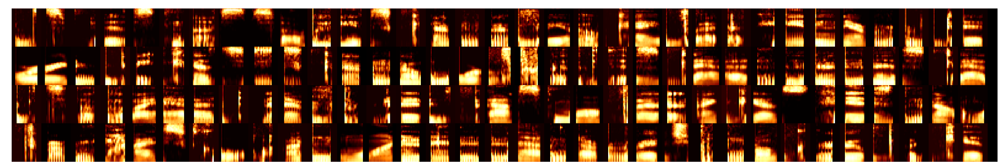

s17 15740


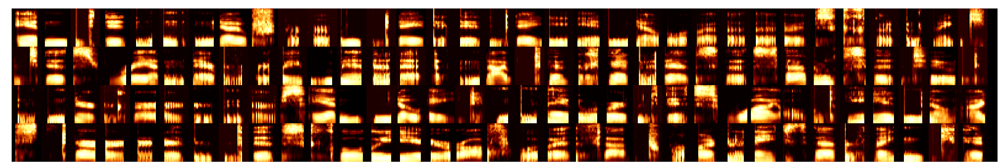

s18 27180


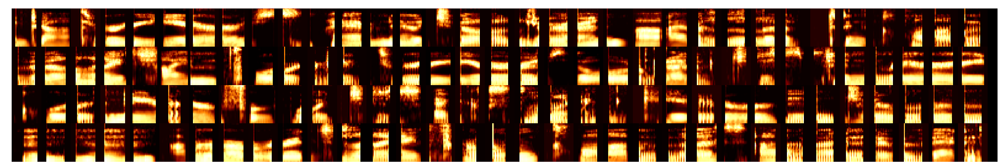

s19 31905


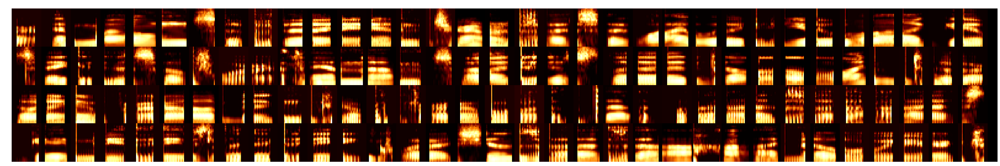

s20 9141


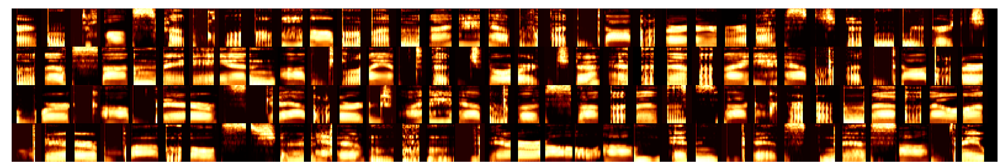

s21 13973


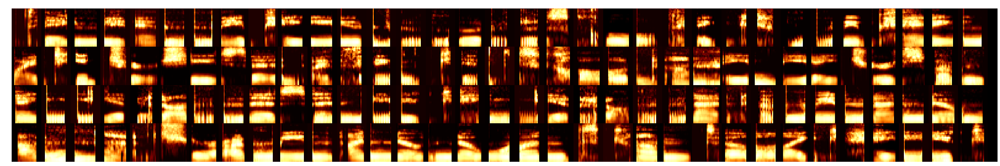

s22 18324


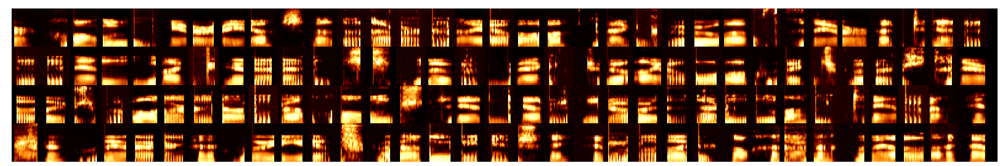

s23 19630


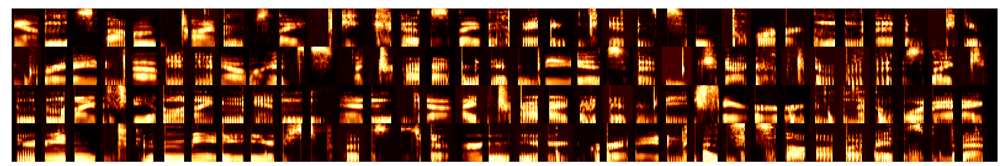

s24 20589


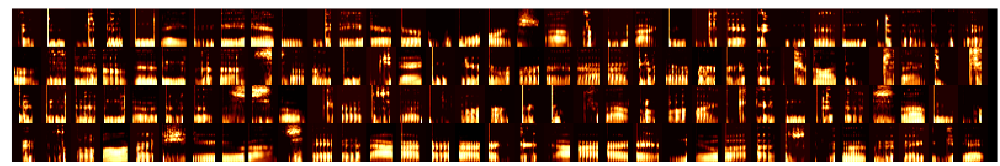

s25 25189


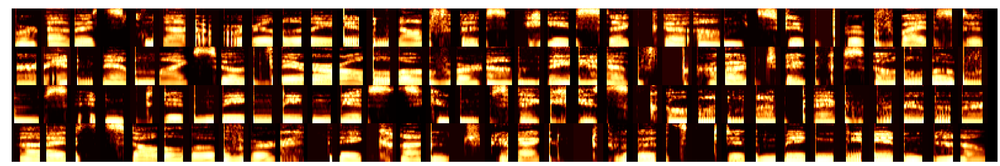

s26 13259


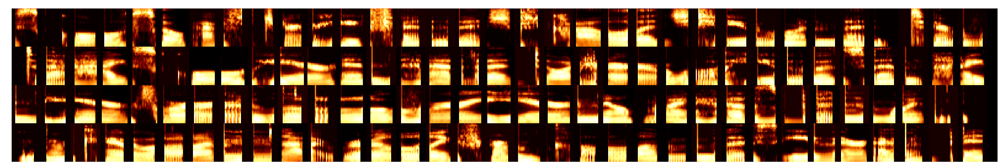

s27 19219


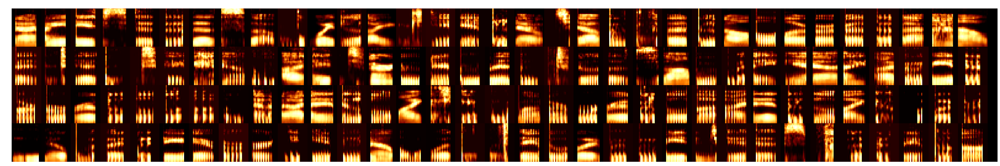

s28 20711


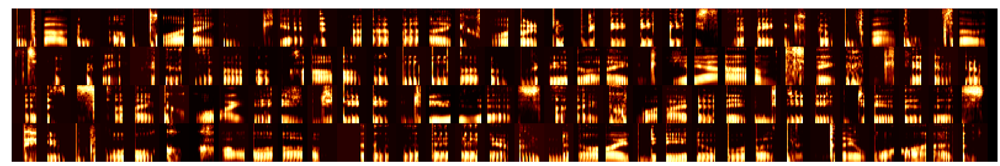

s29 23632


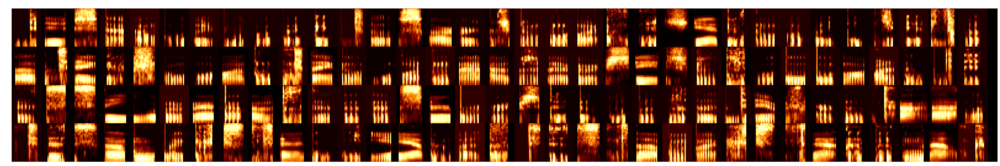

s30 21838


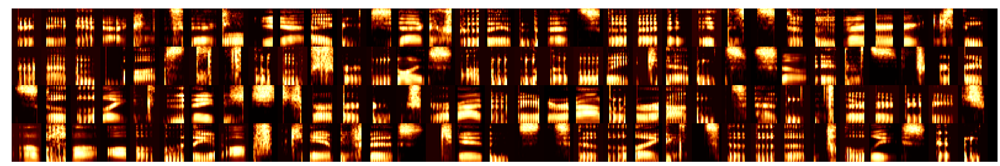

s31 15275


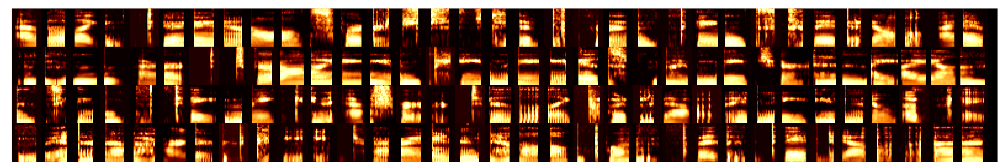

s32 17186


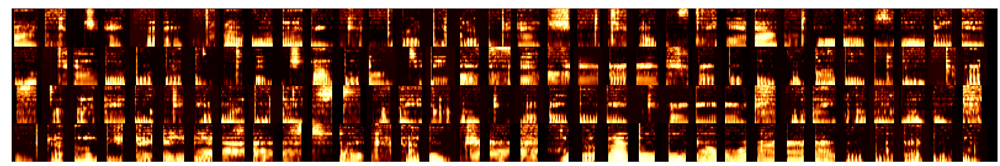

s33 17663


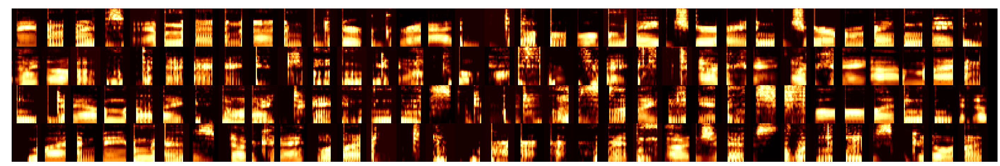

s34 22251


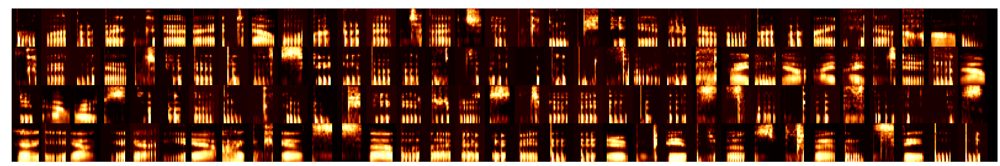

s35 26858


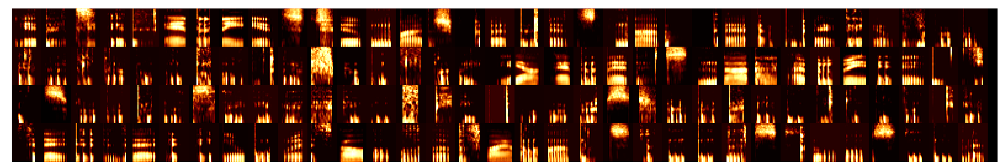

s36 16792


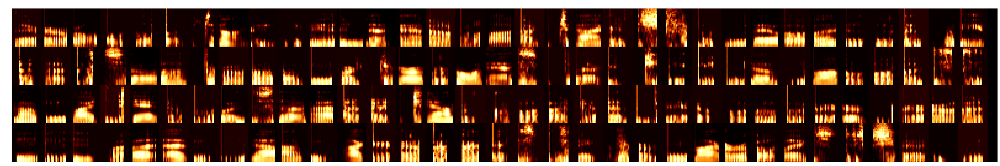

s37 14767


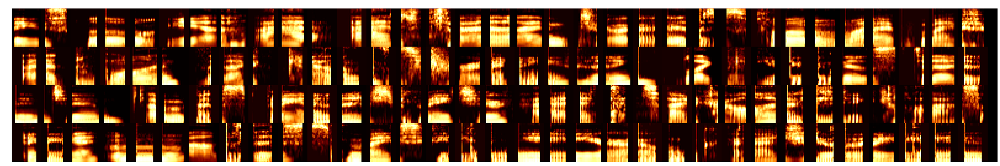

s38 22734


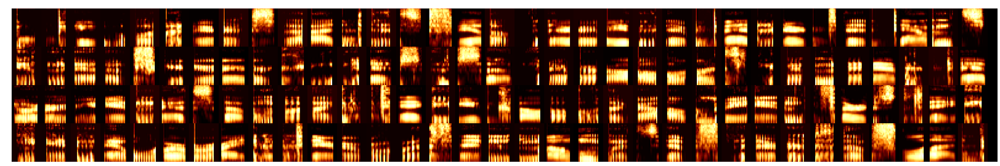

s39 20773


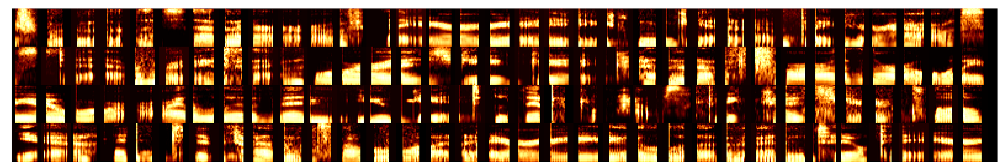

s40 20853


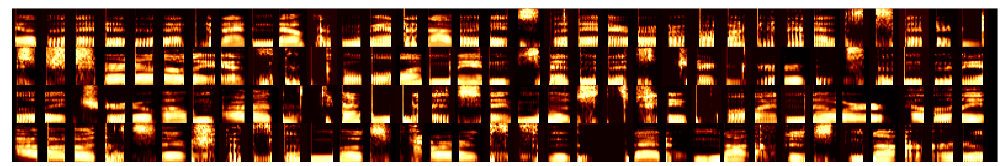

In [88]:
for indv in np.sort(syllable_df.indv.unique()):
    print(indv, np.sum(syllable_df.indv == indv))
    specs = np.array([i/np.max(i) for i in syllable_df[syllable_df.indv == indv].spectrogram.values])
    specs[specs<0] = 0
    draw_spec_set(specs, zoom=2,
                  maxrows=4, 
                  colsize=25)

### save dataset

In [89]:
save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'phones.pickle'
ensure_dir(save_loc)
syllable_df.to_pickle(save_loc)